artifact already exists at ./models/singular-0.0.1.pth. Skipping download.
Loading model weights from ./models/singular-0.0.1.pth ...
Model loaded successfully.
artifact already exists at ./models/rekd-0.0.1.pt. Skipping download.
Loading model weights from ./models/rekd-0.0.1.pt ...
Model loaded successfully.


================ SP ================


------ MADEIRAS ------
SP_34_12_34_12.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Matches found: torch.Size([31, 2])


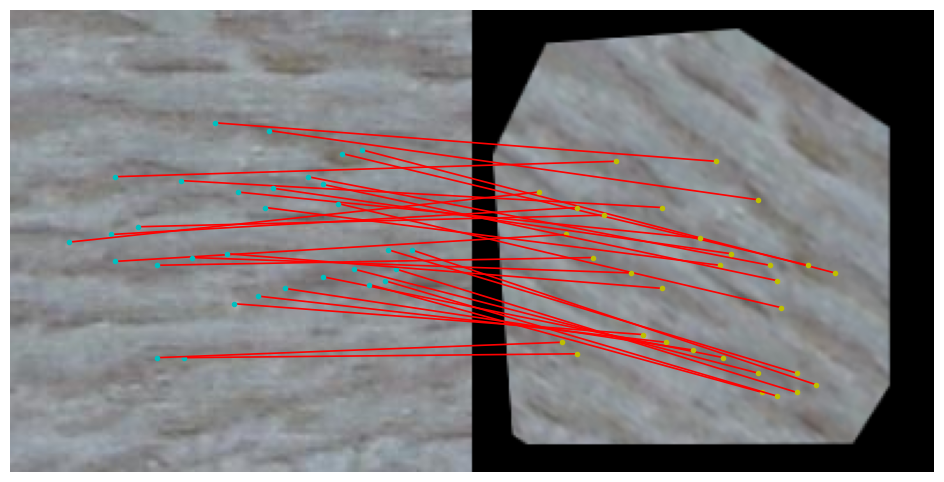

SP_34_12_36_12.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Matches found: torch.Size([0, 2])


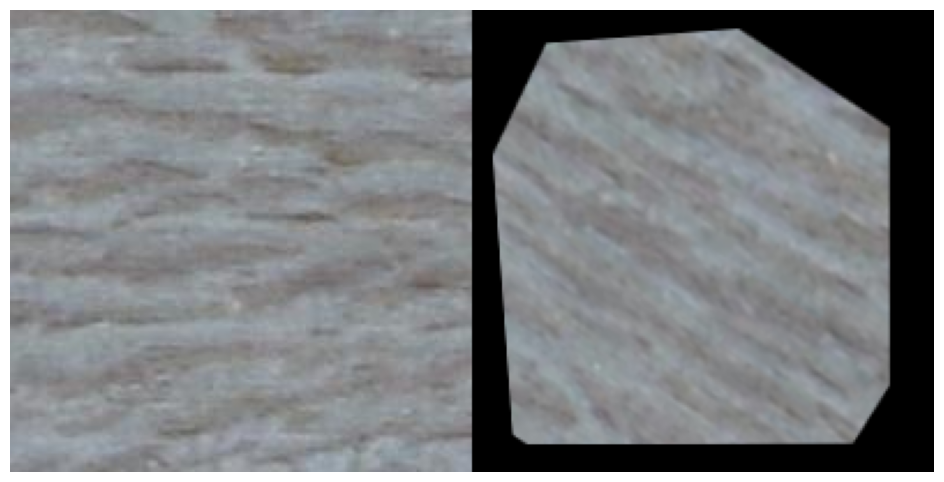

SP_34_12_38_12.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Matches found: torch.Size([0, 2])


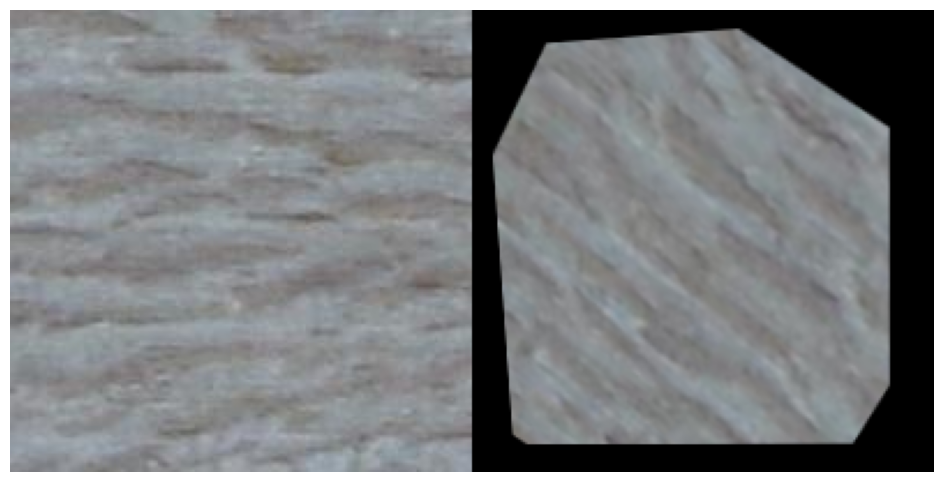

SP_34_12_44_12.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Matches found: torch.Size([0, 2])


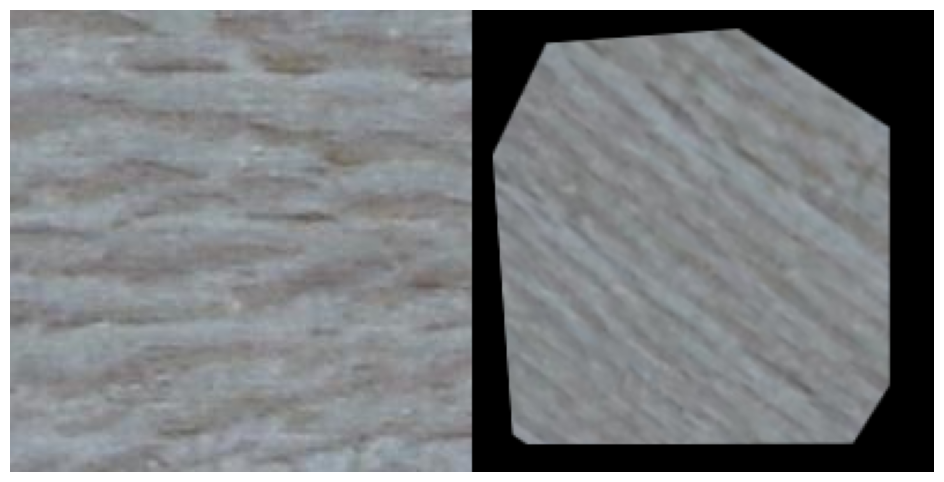


------ FIBRAS ------
SP_doc_039_doc_039.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Matches found: torch.Size([22, 2])


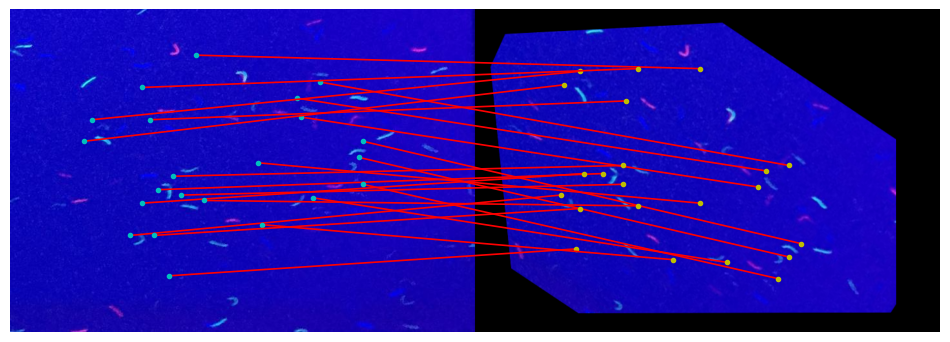

SP_doc_039_doc_041.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Matches found: torch.Size([0, 2])


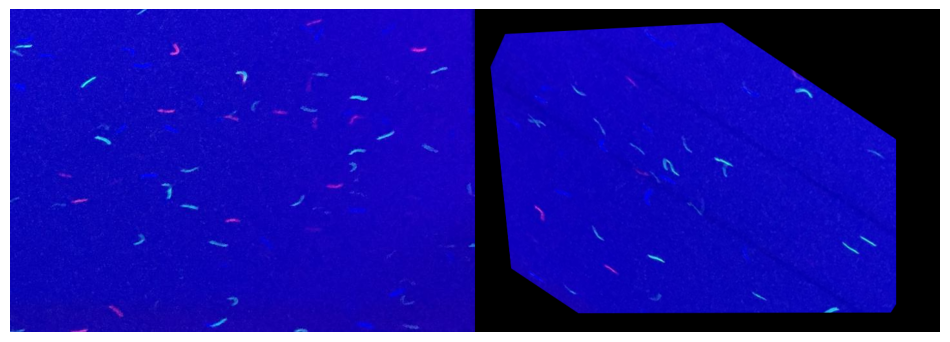

SP_doc_039_doc_043.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Matches found: torch.Size([0, 2])


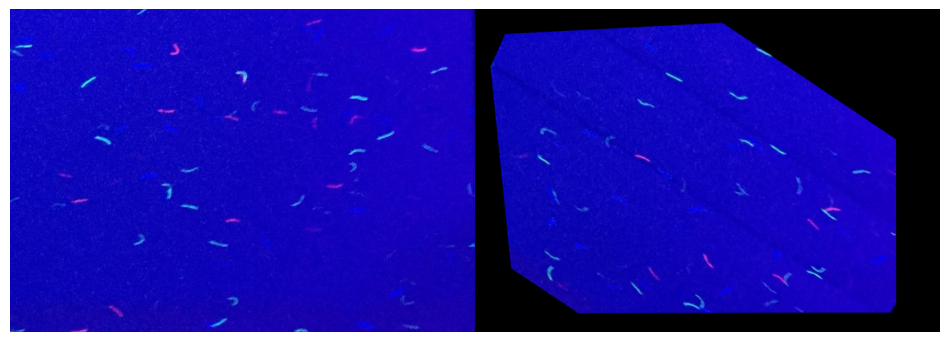

SP_doc_039_doc_045.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Matches found: torch.Size([0, 2])


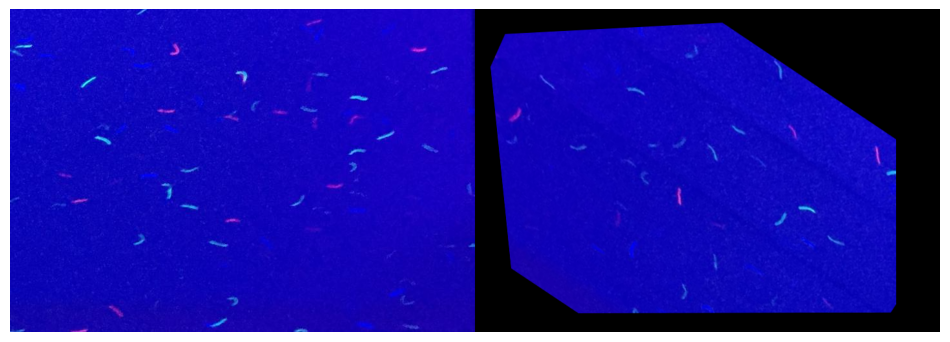



================ REKD ================


------ MADEIRAS ------
REKD_34_12_34_12.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 30, 2, 3]), Descriptors: torch.Size([1, 30, 128])
Matches found: torch.Size([8, 2])


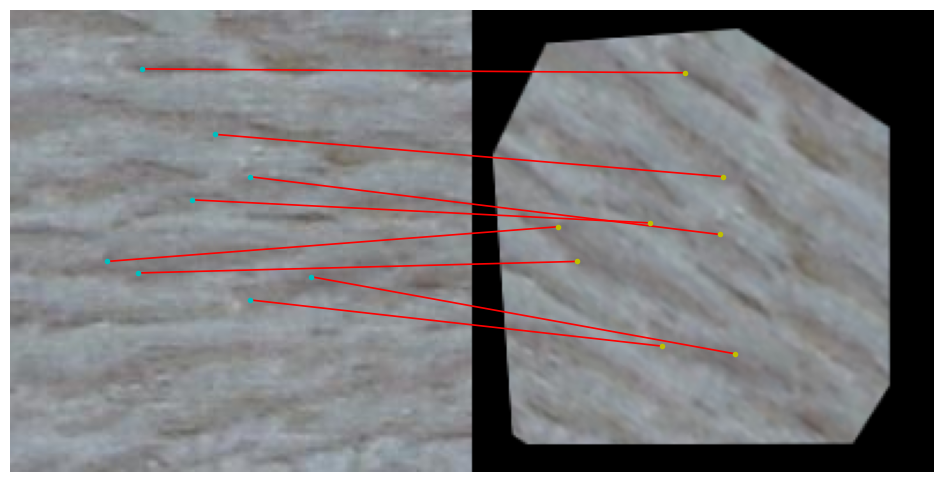

REKD_34_12_36_12.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 22, 2, 3]), Descriptors: torch.Size([1, 22, 128])
Matches found: torch.Size([0, 2])


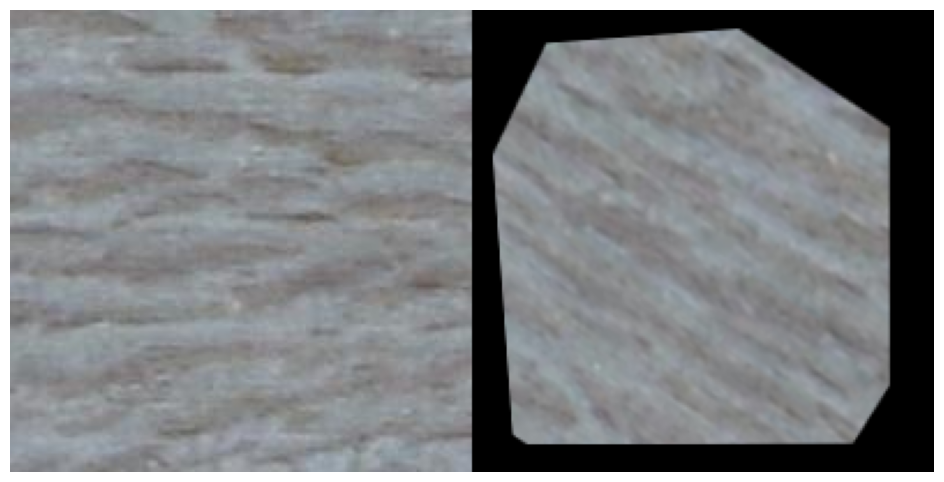

REKD_34_12_38_12.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 29, 2, 3]), Descriptors: torch.Size([1, 29, 128])
Matches found: torch.Size([1, 2])


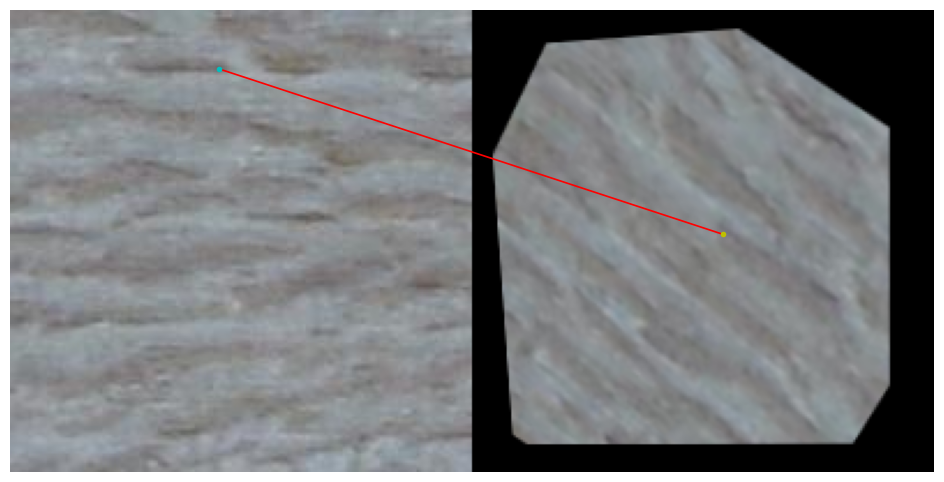

REKD_34_12_44_12.png
Image 1 - LAFs: torch.Size([1, 60, 2, 3]), Descriptors: torch.Size([1, 60, 128])
Image 2 - LAFs: torch.Size([1, 19, 2, 3]), Descriptors: torch.Size([1, 19, 128])
Matches found: torch.Size([1, 2])


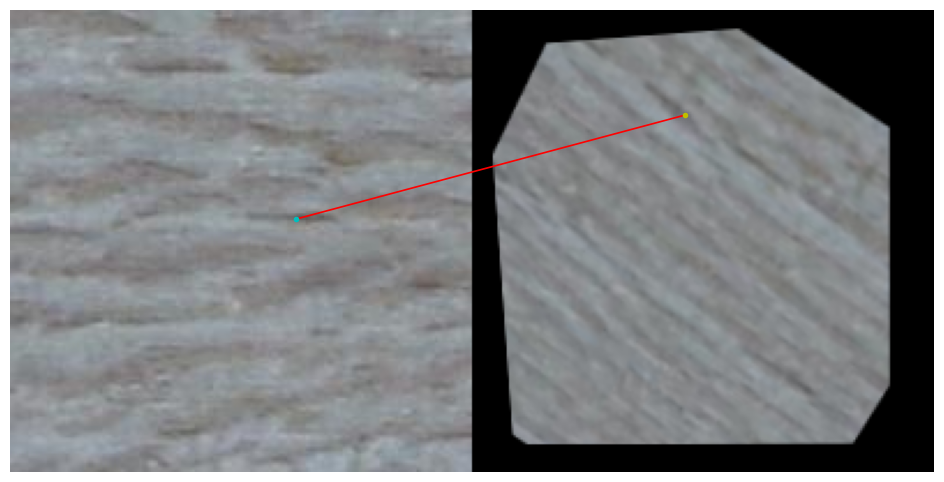


------ FIBRAS ------
REKD_doc_039_doc_039.png
Image 1 - LAFs: torch.Size([1, 5, 2, 3]), Descriptors: torch.Size([1, 5, 128])
Image 2 - LAFs: torch.Size([1, 13, 2, 3]), Descriptors: torch.Size([1, 13, 128])
Matches found: torch.Size([5, 2])


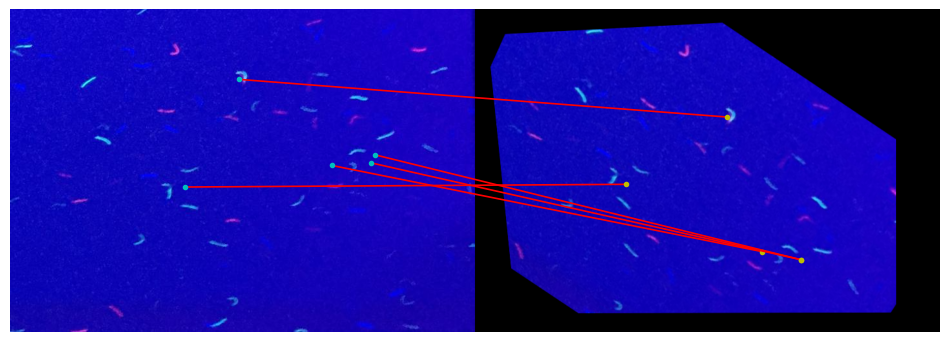

REKD_doc_039_doc_041.png
Image 1 - LAFs: torch.Size([1, 5, 2, 3]), Descriptors: torch.Size([1, 5, 128])
Image 2 - LAFs: torch.Size([1, 14, 2, 3]), Descriptors: torch.Size([1, 14, 128])
Matches found: torch.Size([1, 2])


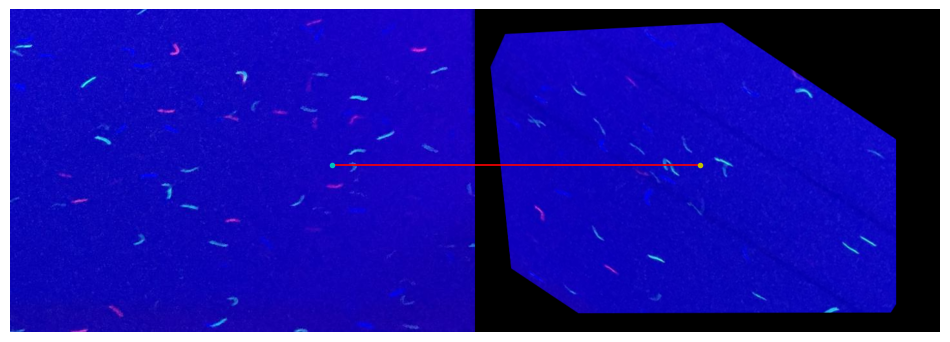

REKD_doc_039_doc_043.png
Image 1 - LAFs: torch.Size([1, 5, 2, 3]), Descriptors: torch.Size([1, 5, 128])
Image 2 - LAFs: torch.Size([1, 6, 2, 3]), Descriptors: torch.Size([1, 6, 128])
Matches found: torch.Size([0, 2])


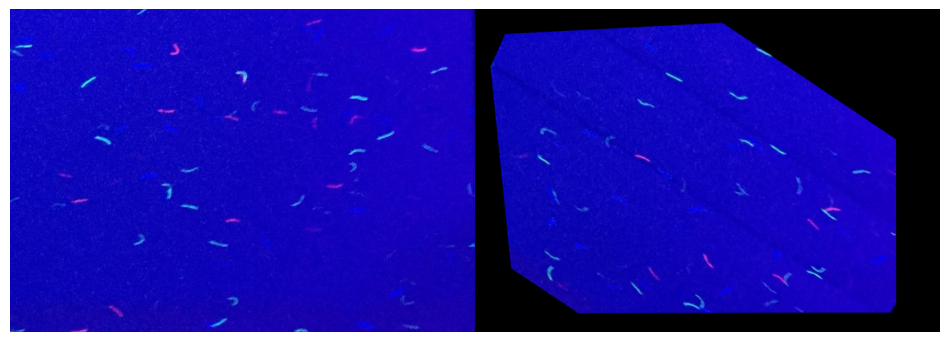

REKD_doc_039_doc_045.png
Image 1 - LAFs: torch.Size([1, 5, 2, 3]), Descriptors: torch.Size([1, 5, 128])
Image 2 - LAFs: torch.Size([1, 6, 2, 3]), Descriptors: torch.Size([1, 6, 128])
Matches found: torch.Size([0, 2])


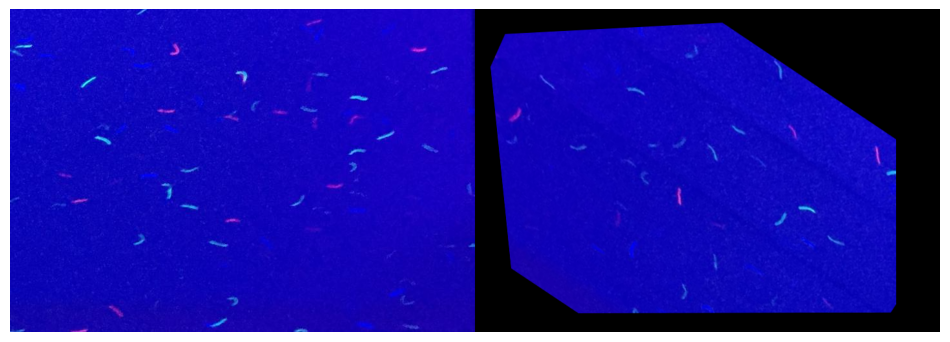

In [9]:
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as T
import kornia as K
import kornia.feature as KF
from visidex.kornia_local_feature import SingularPointHardNet, REKDHardNet
from kornia.feature import DescriptorMatcher
import os
# ======= CONFIGURAÇÃO =======
DEVICE = 'cuda'
IMG_SIZE = 120
torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# ======= TRANSFORM =======
def get_transform(img_size=IMG_SIZE):
    return T.Compose([
        T.Resize((img_size, img_size)),
        T.Grayscale(),
        T.ToTensor(),
        T.Normalize((0.5,), (0.5,))
    ])
# ======= EXTRAÇÃO DE FEATURES =======
def extract_features(img_pil, transform, model, device):
    tensor = transform(img_pil).unsqueeze(0).to(device)
    lafs, _, descriptors = model(tensor)
    return tensor, lafs, descriptors

# ======= TRANSFORMAÇÕES =======
def apply_geometric_and_photometric_transform(img_pil, seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

    tensor = T.ToTensor()(img_pil).unsqueeze(0).to(DEVICE)

    aug = K.augmentation.AugmentationSequential(
        # Geométricas
        K.augmentation.RandomAffine(degrees=45, translate=(0.1, 0.1),
                                    scale=(0.8, 1.2), shear=10, p=1.0),
        K.augmentation.RandomPerspective(0.2, p=1.0),
        # Fotométricas
        # K.augmentation.ColorJitter(brightness=0.1, contrast=0.1,
        #                            saturation=0.1, hue=0.05, p=0.9),
        K.augmentation.RandomGaussianBlur((3, 3), sigma=(0.1, 1.0), p=0.5),
        data_keys=["input"],
        same_on_batch=True
    )

    tensor_aug = aug(tensor)
    return T.ToPILImage()(tensor_aug.squeeze(0).cpu())
# ======= VISUALIZAÇÃO =======
def visualize_matching_original(img1_pil, img2_pil, laf1, laf2, matches, img_size=IMG_SIZE):
    img1 = np.array(img1_pil)
    img2 = np.array(img2_pil)
    combined = np.concatenate((img1, img2), axis=1)

    scale_x1, scale_y1 = img1_pil.width / img_size, img1_pil.height / img_size
    scale_x2, scale_y2 = img2_pil.width / img_size, img2_pil.height / img_size

    pts1 = KF.get_laf_center(laf1)[0].detach().cpu().numpy()
    pts2 = KF.get_laf_center(laf2)[0].detach().cpu().numpy()

    pts1[:, 0] *= scale_x1
    pts1[:, 1] *= scale_y1
    pts2[:, 0] *= scale_x2
    pts2[:, 1] *= scale_y2

    plt.figure(figsize=(12, 6))
    plt.imshow(combined)
    plt.axis('off')

    for idx1, idx2 in matches.detach().cpu().numpy():
        x1, y1 = pts1[idx1]
        x2, y2 = pts2[idx2]
        x2_shifted = x2 + img1.shape[1]
        plt.plot([x1, x2_shifted], [y1, y2], 'r-', linewidth=1.2)
        plt.plot(x1, y1, 'co', markersize=3)
        plt.plot(x2_shifted, y2, 'yo', markersize=3)

    plt.show()

# ======= FUNÇÃO PRINCIPAL =======
def match_and_visualize_with_transform(img1_path, img2_path, model):
    transform = get_transform()
    descriptor_matcher = DescriptorMatcher(match_mode="snn", th=0.80).to(DEVICE).eval()

    img1_pil = Image.open(img1_path).convert('RGB')
    img2_pil = Image.open(img2_path).convert('RGB')

    img2_aug_pil = apply_geometric_and_photometric_transform(img2_pil)

    _, lafs1, desc1 = extract_features(img1_pil, transform, model, DEVICE)
    _, lafs2, desc2 = extract_features(img2_aug_pil, transform, model, DEVICE)

    _, matches = descriptor_matcher(desc1[0], desc2[0])

    print(f"Image 1 - LAFs: {lafs1.shape}, Descriptors: {desc1.shape}")
    print(f"Image 2 - LAFs: {lafs2.shape}, Descriptors: {desc2.shape}")
    print(f"Matches found: {matches.shape}")

    visualize_matching_original(img1_pil, img2_aug_pil, lafs1, lafs2, matches, img_size=IMG_SIZE)

# ======= EXECUÇÃO =======
if __name__ == "__main__":
    woods_imgs = [
        './datasets/teste1/34_12.jpg',
        './datasets/teste1/36_12.jpg',
        './datasets/teste1/38_12.jpg',
        './datasets/teste1/44_12.jpg'
    ]

    fibers_imgs = [
        './datasets/teste1/doc_039.jpg',
        './datasets/teste1/doc_041.jpg',
        './datasets/teste1/doc_043.jpg',
        './datasets/teste1/doc_045.jpg'
    ]

    models = {
        "SP": SingularPointHardNet(num_features=60).to(DEVICE).eval(),
        "REKD": REKDHardNet(num_features=60).to(DEVICE).eval()
    }

    def run_matching(model_name, model, base_img, img_list, label):
        print(f"\n------ {label.upper()} ------")
        base_name = os.path.splitext(os.path.basename(base_img))[0]

        for img2_path in img_list:
            img1_name = base_name
            img2_name = os.path.splitext(os.path.basename(img2_path))[0]
            tag = f"{model_name}_{img1_name}_{img2_name}.png"
            print(tag)
            match_and_visualize_with_transform(base_img, img2_path, model)

    # ===== Loop principal =====
    for model_name, model in models.items():
        print(f"\n\n================ {model_name} ================\n")
        run_matching(model_name, model, woods_imgs[0], woods_imgs, "madeiras")
        run_matching(model_name, model, fibers_imgs[0], fibers_imgs, "fibras")


artifact already exists at ./models/singular-0.0.1.pth. Skipping download.
Loading model weights from ./models/singular-0.0.1.pth ...
Model loaded successfully.
artifact already exists at ./models/rekd-0.0.1.pt. Skipping download.
Loading model weights from ./models/rekd-0.0.1.pt ...
Model loaded successfully.

--- Avaliando modelo: SP ---
[INFO] Imagem original: (240, 240, 3), Imagem transformada: (240, 240, 3)
[INFO] Ajustando keypoints: scale_x=2.000, scale_y=2.000


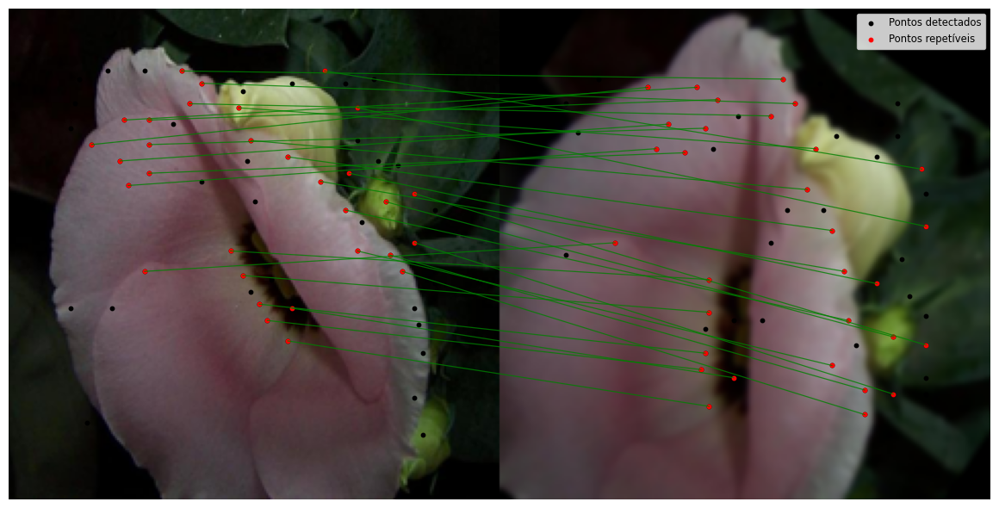

SP_image_07144_31.png
[SP] Repetibilidade: 0.517 (31 correspondências / 60 pontos visíveis)
[INFO] Imagem original: (240, 240, 3), Imagem transformada: (240, 240, 3)
[INFO] Ajustando keypoints: scale_x=2.000, scale_y=2.000


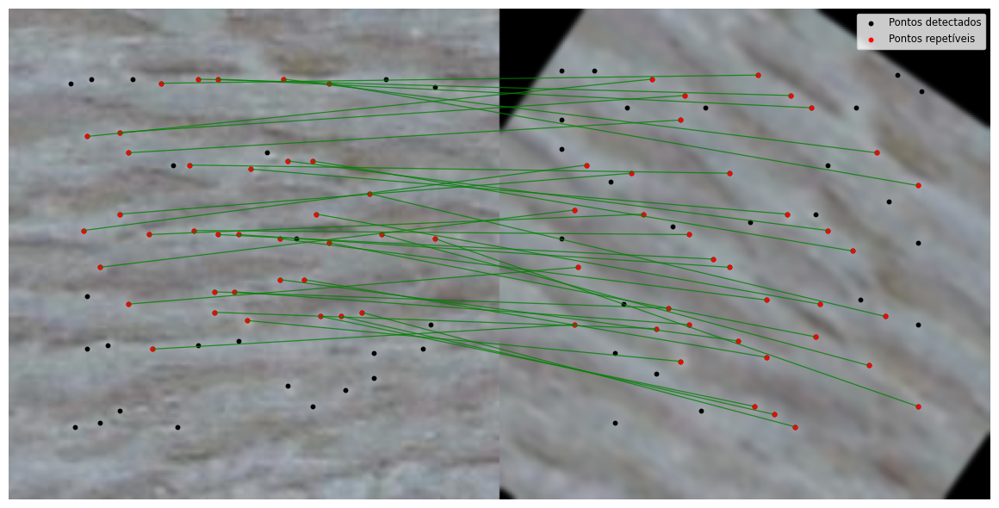

SP_34_12_36.png
[SP] Repetibilidade: 0.600 (36 correspondências / 60 pontos visíveis)
[INFO] Imagem original: (240, 240, 3), Imagem transformada: (240, 240, 3)
[INFO] Ajustando keypoints: scale_x=2.000, scale_y=2.000


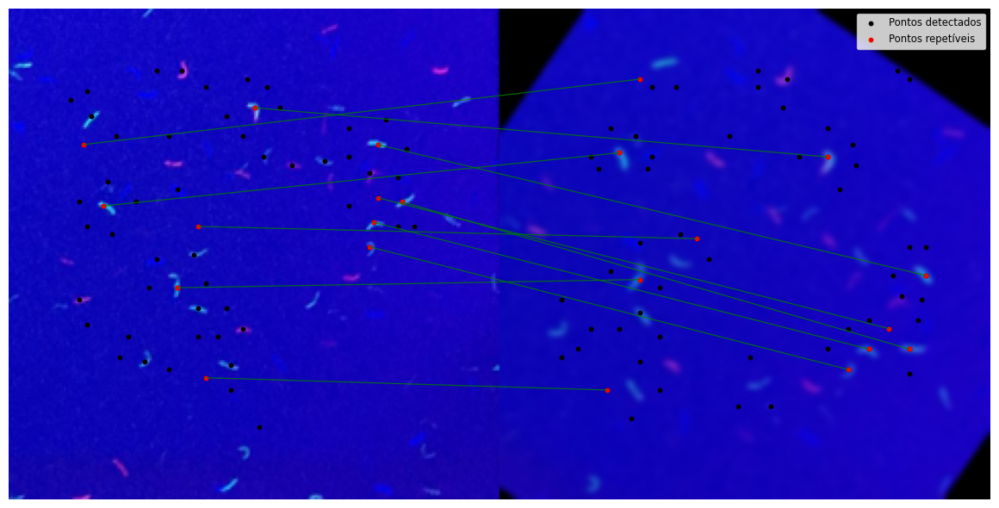

SP_doc_039_11.png
[SP] Repetibilidade: 0.183 (11 correspondências / 60 pontos visíveis)

--- Avaliando modelo: REKD ---
[INFO] Imagem original: (240, 240, 3), Imagem transformada: (240, 240, 3)
[INFO] Ajustando keypoints: scale_x=2.000, scale_y=2.000


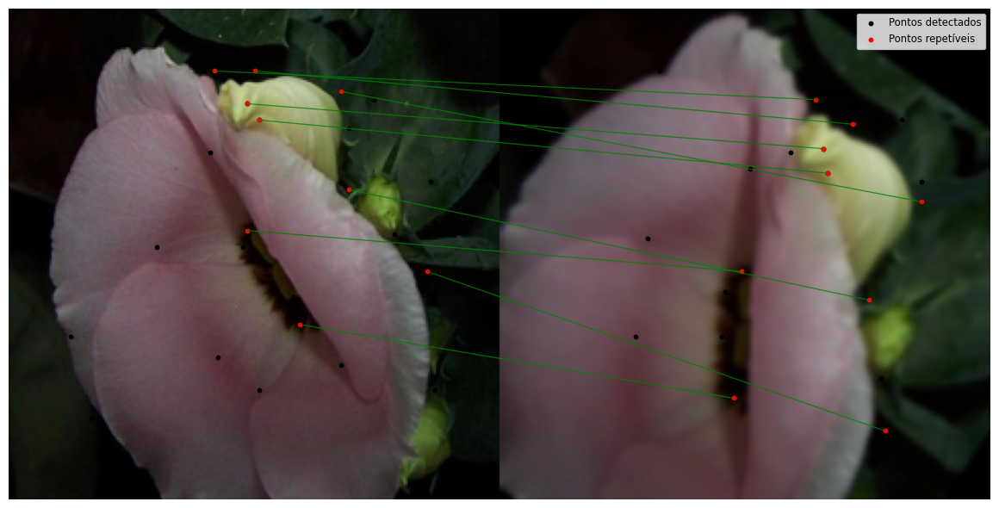

REKD_image_07144_9.png
[REKD] Repetibilidade: 0.375 (9 correspondências / 24 pontos visíveis)
[INFO] Imagem original: (240, 240, 3), Imagem transformada: (240, 240, 3)
[INFO] Ajustando keypoints: scale_x=2.000, scale_y=2.000


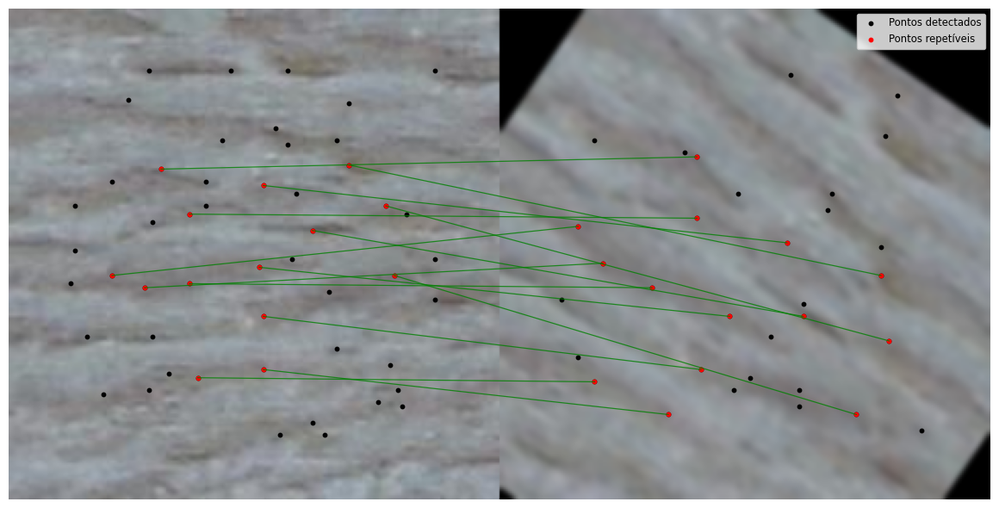

REKD_34_12_14.png
[REKD] Repetibilidade: 0.280 (14 correspondências / 50 pontos visíveis)
[INFO] Imagem original: (240, 240, 3), Imagem transformada: (240, 240, 3)
[INFO] Ajustando keypoints: scale_x=2.000, scale_y=2.000


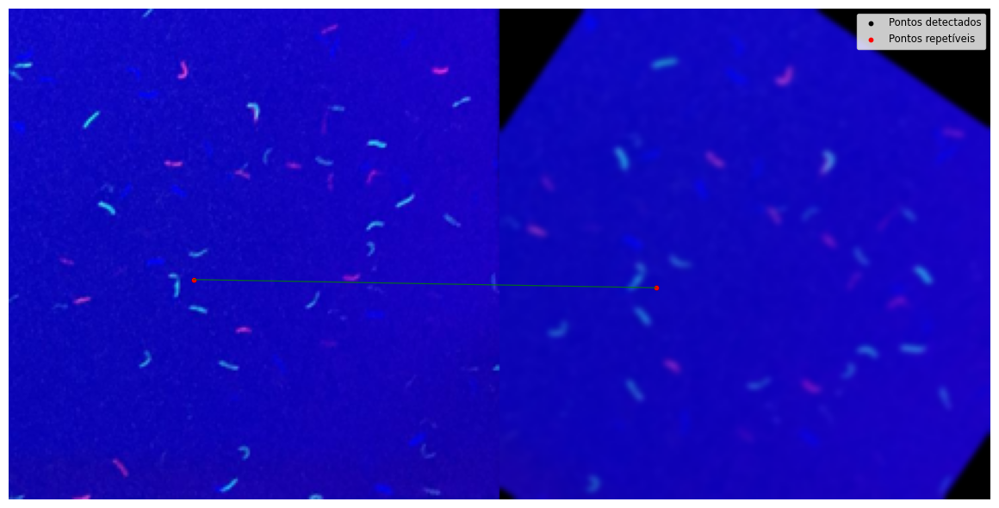

REKD_doc_039_1.png
[REKD] Repetibilidade: 1.000 (1 correspondências / 1 pontos visíveis)


In [94]:
import os
import torch
import torchvision.transforms as T
import kornia as K
import kornia.feature as KF
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.spatial.distance import cdist
from visidex.kornia_local_feature import SingularPointHardNet, REKDHardNet

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(42)

def load_image(path, size=(240,240)):
    img = Image.open(path).convert("L")
    transform = T.Compose([T.Resize(size), T.ToTensor()])
    return transform(img).unsqueeze(0).to(DEVICE)

def extract_keypoints(img, model):
    with torch.no_grad():
        lafs, _, _ = model(img)
    return KF.get_laf_center(lafs)

def filter_keypoints(points, mask_tensor):
    points = points.cpu().numpy() if isinstance(points, torch.Tensor) else points
    mask = mask_tensor.cpu().numpy().astype(bool)
    H, W = mask.shape
    points_clamped = np.clip(np.round(points).astype(int), [[0,0]], [[W-1,H-1]])
    mask_in = mask[points_clamped[:,1], points_clamped[:,0]]
    return points[mask_in]

def match_points_exact(p1, p2, max_distance=1.0):
    matches, distances = [], []
    for i, pt in enumerate(p1):
        if len(p2) == 0: continue
        dists = np.linalg.norm(p2 - pt, axis=1)
        min_idx = np.argmin(dists)
        if dists[min_idx] <= max_distance:
            matches.append((i, min_idx))
            distances.append(dists[min_idx])
    return matches, distances

def to_rgb(img):
    if img.ndim == 2: img = np.stack([img]*3, axis=-1)
    if img.ndim == 3 and img.shape[2] == 1: img = np.repeat(img,3,axis=2)
    return img

def ensure_image_uint8(img):
    """Converte tensor ou grayscale em RGB uint8"""
    if isinstance(img, torch.Tensor):
        img = np.clip(K.utils.tensor_to_image(img.cpu()) * 255, 0, 255).astype(np.uint8)
    img = to_rgb(img)
    return img

def plot_matches(img_orig, keypoints_orig, img_transformed, keypoints_transformed, matches=None, source_size=None):
    # Converte imagens para RGB uint8, se necessário
    img_orig = ensure_image_uint8(img_orig)
    img_transformed = ensure_image_uint8(img_transformed)

    print(f"[INFO] Imagem original: {img_orig.shape}, Imagem transformada: {img_transformed.shape}")

    if img_orig.shape[:2] != img_transformed.shape[:2]:
        raise ValueError(f"As imagens devem ter a mesma resolução: {img_orig.shape} vs {img_transformed.shape}")

    target_height, target_width = img_orig.shape[:2]

    # Ajusta os keypoints para o tamanho alvo, se a fonte tiver dimensão diferente
    if source_size is not None:
        source_height, source_width = source_size
        scale_x_points = target_width / source_width
        scale_y_points = target_height / source_height
        print(f"[INFO] Ajustando keypoints: scale_x={scale_x_points:.3f}, scale_y={scale_y_points:.3f}")
        keypoints_orig = (keypoints_orig * [scale_x_points, scale_y_points]).copy()
        keypoints_transformed = (keypoints_transformed * [scale_x_points, scale_y_points]).copy()
    else:
        print("[INFO] Nenhum ajuste de keypoints necessário")

    # Concatena as imagens lado a lado
    combined = np.concatenate([img_orig, img_transformed], axis=1)
    offset_x = img_orig.shape[1]

    # Plota
    fig, ax = plt.subplots(figsize=(18, 6))
    ax.imshow(combined)

    if len(keypoints_orig):
        ax.scatter(keypoints_orig[:, 0], keypoints_orig[:, 1], c='black', s=10, label='Pontos detectados')
    if len(keypoints_transformed):
        ax.scatter(keypoints_transformed[:, 0] + offset_x, keypoints_transformed[:, 1], c='black', s=10)

    if matches is not None:
        for i, (idx_orig, idx_trans) in enumerate(matches):
            kp_orig, kp_transformed = keypoints_orig[idx_orig], keypoints_transformed[idx_trans]
            ax.plot([kp_orig[0], kp_transformed[0] + offset_x],
                    [kp_orig[1], kp_transformed[1]], 'g-', lw=0.9, alpha=0.8)
            ax.scatter(kp_orig[0], kp_orig[1], c='red', s=10, label='Pontos repetíveis' if i == 0 else "")
            ax.scatter(kp_transformed[0] + offset_x, kp_transformed[1], c='red', s=10)

    ax.axis("off")
    ax.legend(loc='upper right', fontsize='small')
    plt.tight_layout()
    plt.show()


import kornia.geometry.transform as KT
def apply_transform_both(img_small, img_large, mask_small, keypoints_small, seed=42):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)

    B, C, H_small, W_small = img_small.shape
    _, _, H_large, W_large = img_large.shape

    geom = K.augmentation.AugmentationSequential(
        K.augmentation.RandomAffine(degrees=45, translate=(0.1,0.1), scale=(0.8,1.2), p=1.0,align_corners=False),
        # K.augmentation.RandomPerspective(0.2, p=1.0),
        data_keys=["input", "mask", "keypoints"],
        same_on_batch=True
    )


    photo = K.augmentation.AugmentationSequential(
        K.augmentation.RandomGaussianBlur((9, 9), sigma=(0.1, 2.0), p=1.0),
        # pode adicionar ColorJitter, etc
        data_keys=["input"],
        same_on_batch=True
    )

    # Aplica à imagem pequena
    img_small_geo, mask_aug, keypoints_aug = geom(img_small, mask_small, keypoints_small)

    # Recupera a matriz de transformação 3x3
    M_small_3x3 = geom[0].get_transformation_matrix(img_small)  # shape (B,3,3)

    # Converte para 2x3 para warp_affine
    M_small_2x3 = M_small_3x3[:, :2, :]

    # Ajusta a translação para o tamanho grande
    scale_x = W_large / W_small
    scale_y = H_large / H_small
    M_large_2x3 = M_small_2x3.clone()
    M_large_2x3[:,0,2] *= scale_x
    M_large_2x3[:,1,2] *= scale_y

    # Aplica à imagem grande
    img_large_geom = KT.warp_affine(img_large, M_large_2x3, dsize=(H_large, W_large))
    
    img_small_aug = photo(img_small_geo)
    img_large_aug = photo(img_large_geom)


    return img_small_aug, img_large_aug, mask_aug, keypoints_aug


def detect_repeatability(img_path, model, size=(120,120)):
    # --- Carregar imagens ---
    img_orig = Image.open(img_path).convert("RGB").resize((240,240))
    img_orig_tensor = T.ToTensor()(img_orig).unsqueeze(0).to(DEVICE)  # sem resize
    img_orig_np = np.array(img_orig)

    img_tensor = load_image(img_path, size=size)  # reduzida → modelo

    # --- Extrair keypoints ---
    points1 = extract_keypoints(img_tensor, model)
    H, W = img_tensor.shape[-2:]
    mask = torch.ones(1,1,H,W, device=DEVICE)

    # --- Aplicar mesma transformação nas duas imagens ---
    img_aug, img_aug_orig, mask_t, points_aug = apply_transform_both(img_tensor, img_orig_tensor, mask, points1)
    img_aug_orig_np = (
        img_aug_orig[0].permute(1, 2, 0).detach().cpu().numpy() * 255
    ).astype(np.uint8)
    # --- Filtrar keypoints no espaço reduzido ---
    filtered1 = filter_keypoints(points_aug[0], mask_t[0,0])

    # plot_matches(img_orig_np, points1[0].cpu().numpy(), img_aug_orig_np, filtered1, matches=[],source_size=(120,120))
    points2 = extract_keypoints(img_aug, model)

    
    filtered2 = filter_keypoints(points2[0], mask_t[0,0])

    mask_in = np.isin(points_aug[0].cpu().numpy(), filtered1).all(axis=1)
    missing_idx = np.where(~mask_in)[0]
    points1_filtered = np.delete(points1[0].cpu().numpy(), missing_idx, axis=0)
    
    matches, _ = match_points_exact(filtered1, filtered2, max_distance=1.0)
    if len(matches): 
        plot_matches(img_orig_np, points1_filtered, img_aug_orig_np, filtered2, matches,source_size=(120,120))

    repeatability = len(matches)/max(1,len(filtered1))
    return repeatability, len(matches), len(filtered1)

if __name__=="__main__":
    dataset_dir = './datasets/teste1/'
    os.makedirs(dataset_dir, exist_ok=True)
    imgs = [os.path.join(dataset_dir,f"{i}.jpg") for i in ["image_07144","34_12","doc_039"]]#"34_12","36_12",
    for p in imgs:
        if not os.path.exists(p): Image.new('L',(300,300),color='gray').save(p)

    models = {
        "SP": SingularPointHardNet(num_features=60).to(DEVICE).eval(),
        "REKD": REKDHardNet(num_features=60).to(DEVICE).eval()
    }

    for name, model in models.items():
        print(f"\n--- Avaliando modelo: {name} ---")
        for img_path in imgs:            
            rep, n_matches, n_kpts = detect_repeatability(img_path, model)
            print(f"{name}_{os.path.splitext(os.path.basename(img_path))[0]}_{n_matches}.png")
            print(f"[{name}] Repetibilidade: {rep:.3f} ({n_matches} correspondências / {n_kpts} pontos visíveis)")
